
<image src="https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/cover-page.png?raw=true" width=100%>



# <center> **04. Estimación pasiva de la profundidad** </center>

La estimación pasiva de la profundidad es el conjunto de técnicas y algoritmos para estimar la distancia observada de objetos para permitir una comprensión tridimensional (3D) del entorno circundante. Durante esta sesión vamos a aplicar los conceptos explicados, **para estimar la disparidad en imágenes estéreo prediseñadas mediante diversas técnicas de programación y así obtener los mapas de disparidad y profundidad.**

# **Contenido**

[**0. Introducción a la visión estéreo**](#tema1)

[**1. Caso 1: Imagenes Rectificadas**](#tema2)

&emsp;&emsp;[**1.1. Disparidad**](#tema3)

&emsp;&emsp;[**1.2. Profundidad**](#tema4)

&emsp;&emsp;[**1.3. PointCloud - 3D**](#tema5)

[**2. Caso 2: Imágenes No Rectificadas**](#tema6)

&emsp;&emsp;[**2.1 Calibración de camara**](#tema7)

&emsp;&emsp;[**2.2. Rectificación**](#tema8)

&emsp;&emsp;&emsp;&emsp;&emsp; [**2.2.1 Geometría epipolar**](#tema9)

&emsp;&emsp;&emsp;&emsp;&emsp; [**2.2.2 Conceptos**](#tema10)

&emsp;&emsp;&emsp;&emsp;&emsp; [**2.2.3 KeyPoints**](#tema11)

&emsp;&emsp;&emsp;&emsp;&emsp;[**2.2.4 Matriz Fundamental**](#tema12)

&emsp;&emsp;&emsp;&emsp;&emsp;[**2.2.5 Lineas epipolares**](#tema13)

&emsp;&emsp;&emsp;&emsp;&emsp;[**2.2.6 Homografías**](#tema14)

&emsp;&emsp;[**2.3 Disparidad**](#tema15)

&emsp;&emsp;[**2.4 Profundidad**](#tema16)

&emsp;&emsp;[**2.5 PointCloud -3D**](#tema17)

In [1]:
#@title **Instalar Paquetes**

!pip install open3d
!pip install plotly


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 33.0 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.6
    Uninstalling widgetsnbextension-3.6.6:
      Successfully uninstalled widgetsnbextension-3.6.6
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


In [2]:
#@title **Cargar librerias**
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import requests
from PIL import Image
from io import BytesIO
import plotly.graph_objects as go
import open3d as o3d
from PIL import Image
import random


In [3]:
#@title Funciones Necesarias { display-mode: "form" }
def descargar_imagenes(carpeta, color=None):
    base_url = "https://github.com/semilleroCV/Hands-on-Computer-Vision/raw/main/Sesiones/Sesion5/Parte%201/Datasetss/{}/{}"
    im0, im1 = None, None
    size = (384, 288)  # Tamaño deseado: (ancho, alto)

    for img in ['im0.png', 'im1.png']:
        url = base_url.format(carpeta, img)
        response = requests.get(url)
        if response.status_code == 200:
            image = Image.open(BytesIO(response.content))
            image = image.resize(size, Image.LANCZOS)
            if img == 'im0.png':
                im0 = image
            else:
                im1 = image
        else:
            print(f"No se pudo descargar la imagen: {url}")

    if color == "Color":
      imgL_np = np.array(im0)
      imgR_np = np.array(im1)
    else:
      imgL_np = np.array(im0.convert('L'))
      imgR_np = np.array(im1.convert('L'))

    return imgL_np, imgR_np


def show_images(img1, img2, title1, title2):
    print("Image sizes:", img1.shape, "and", img2.shape)
    plt.figure(figsize=(15,9))
    plt.subplot(1, 2, 1)
    plt.imshow(img1, cmap="gray")
    plt.title(title1)

    plt.subplot(1, 2, 2)
    plt.imshow(img2,cmap="gray")
    plt.title(title2)
    plt.show()

def draw_epilines_and_points(img1, lines, pts1):
    img_with_epilines = img1.copy()
    color = (255, 0, 0)

    for line, pt1 in zip(lines, pts1):
        x0, y0 = map(int, [0, -line[2] / line[1]])
        x1, y1 = map(int, [img1.shape[1], -(line[2] + line[0] * img1.shape[1]) / line[1]])
        img_with_epilines = cv.line(img_with_epilines, (x0, y0), (x1, y1), color, 1)
        pt1 = (int(pt1[0]), int(pt1[1]))
        img_with_epilines = cv.circle(img_with_epilines, pt1, 5, color, -1)
    return img_with_epilines


def add_epilines_to_rectified_images(imgLeft, imgRight, ptsLeft, ptsRight, h1, h2):
    ptsLeftRtf = cv.perspectiveTransform(np.float32(ptsLeft).reshape(-1, 1, 2), h1).reshape(-1, 2)
    ptsRightRtf = cv.perspectiveTransform(np.float32(ptsRight).reshape(-1, 1, 2), h2).reshape(-1, 2)

    linesLeftRtf = np.zeros((len(ptsLeftRtf), 3))
    linesRightRtf = np.zeros((len(ptsRightRtf), 3))
    linesLeftRtf[:, 1] = -1
    linesRightRtf[:, 1] = -1
    linesLeftRtf[:, 2] = ptsLeftRtf[:, 1]
    linesRightRtf[:, 2] = ptsRightRtf[:, 1]
    imgLeftWithEpilines = draw_epilines_and_points(imgLeft, linesLeftRtf, ptsLeftRtf)
    imgRightWithEpilines = draw_epilines_and_points(imgRight, linesRightRtf, ptsRightRtf)

    return imgLeftWithEpilines, imgRightWithEpilines

def drawlines(img1, img2, lines, pts1, pts2):
    imgLines = img1.copy()
    imgLines1 = img2.copy()
    r, c = imgLines.shape[:2]
    color = (255, 255, 255)


    for line, pt1, pt2 in zip(lines, pts1, pts2):
        x0, y0 = map(int, [0, -line[2] / line[1]])
        x1, y1 = map(int, [c, -(line[2] + line[0] * c) / line[1]])
        imgLines = cv.line(imgLines, (x0, y0), (x1, y1), color, 1)

        pt1 = (int(pt1[0]), int(pt1[1]))
        pt2 = (int(pt2[0]), int(pt2[1]))
        imgLines = cv.circle(imgLines, pt1, 5, color, -1)
        imgLines1 = cv.circle(imgLines1, pt2, 5, color, -1)

    return imgLines



def plot_disparitymap(imgL,imgR,disparity_map):
    disparity_map[(disparity_map <= 0)] = 1

    plt.figure(figsize=(16,5))
    plt.subplot(1,3,1)
    plt.imshow(imgL, cmap='gray')
    plt.title("Image Left")

    plt.subplot(1,3,2)
    plt.imshow(imgR, cmap='gray')
    plt.title("Image Right")

    plt.subplot(1,3,3)
    plt.imshow(disparity_map, cmap='viridis')
    plt.colorbar()
    plt.title('Disparity map')

def plot_3d(points,colors):
  pcd = o3d.geometry.PointCloud()

  pcd.points = o3d.utility.Vector3dVector(np.array(points))
  pcd.colors = o3d.utility.Vector3dVector(np.array(color))
  color_rgb_str = ['rgb({},{},{})'.format(int(r*255), int(g*255), int(b*255)) for r, g, b in color]

  # Crear la figura con Plotly
  points = np.asarray(pcd.points)
  fig = go.Figure(data=[go.Scatter3d(
      x=points[:, 0]*(-1),
      y=points[:, 1],
      z=points[:, 2],
      mode='markers',
      marker=dict(
          size=2,
          color=color_rgb_str,
          opacity=0.8)
  )])
  fig.show()


## <font color='#4C5FDA'>**0. Introducción a la visión estéreo**</font> <a name="tema1">




<font color="EB9A54"> **Visión estéreo** </font> es la técnica de estimación pasiva de la profundidad que se basa en la extracción de información 3D por computación (profundidad, forma, tamaño y ubicación de objetos en el espacio) proveniente de imagenes digitales de multiples escenas, como las obtenidas por una camara CCD. Este enfoque se utiliza en múltiples aplicaciones, como sistemas de asistencia al conductor, navegación robótica, mapeo de escenas, inferencia de profundidad para entretenimiento y, en general, cualquier aplicación donde la profundidad de los objetos en la escena sea una información valiosa.

<div align="center"> <image src="https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/vision-stereo-1.png?raw=true" width=600>  </div>








<font color="EB9A54">**Sistema de visión estéreo estandar**</font>

Al tener múltiples imágenes de una escena, es posible crear un mapa 3D de esa escena utilizando técnicas de visión estéreo. Esto no requiere dos cámaras, sino dos vistas diferentes de la escena. En este sentido, tenemos diferentes posibilidades:

- Dos camaras.
- Imágenes tomadas simultáneamente.
- Se conoce la pose relativa de las cámaras.

<div align="center"> <image src="https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/sistema_estereovision.png?raw=true" width=600>  </div>



<font color="EB9A54">**Reconstrucción de escena usando visión estéreo**</font>

Al tener dos cámaras separadas, podemos reconstruir una escena **(obtener un mapa 3D a tamaño real)** conociendo la disparidad de cada punto y los parámetros intrínsecos de la cámara:

<div align="center"> <image src="https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/our_depth_demo.gif?raw=true" width=600>  </div>

Ahora sabemos que el objetivo de la visión estéreo es recuperar información 3D a partir de imágenes 2D. Un objetivo ambicioso, ¿no?


<font color="EB9A54">**Modelo de visión estéreo**</font>

Conoce el siguiente modelo que describe de los pasos claves de visión estéreo.

<div align="center"> <image src="https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/metodologia.png?raw=true" width=800>  </div>


- <font color= "52F17F"> Calibración: </font> La calibración de la cámara es fundamental para la visión por computadora porque transforma información de imagen en mediciones del mundo real. La calibración intrínseca se ocupa de las propiedades específicas de la cámara, como la distancia focal y el centro óptico, y corrige las distorsiones causadas por las imperfecciones de la lente. Por otro lado, la calibración extrínseca establece la orientación y la posición de la cámara en relación con el mundo real, permitiendo comprender cómo los objetos se ubican en el espacio. Estos procesos son esenciales para aplicaciones que requieren una alta precisión en la reconstrucción 3D, navegación autónoma y realidad aumentada, donde conocer la posición exacta y la orientación de los objetos es crucial.

- <font color="52F17F"> Rectificación: </font> La rectificación estéreo es un proceso que alinea las imágenes de dos cámaras estéreo para que las líneas epipolares se conviertan en horizontales y coincidentes en ambas imágenes. Esto simplifica el cálculo de la disparidad porque el algoritmo solo necesita buscar correspondencias a lo largo de la misma línea horizontal. La rectificación mejora la eficiencia de los algoritmos de emparejamiento estéreo y es un paso preparatorio vital para lograr una estimación de disparidad precisa, facilitando tareas como la medición de distancias y la modelización 3D.

- <font color="52F17F"> Emparejamiento estéreo: </font> En el emparejamiento estéreo, el objetivo es encontrar puntos correspondientes entre dos imágenes de la misma escena tomadas desde diferentes perspectivas. Los algoritmos, como el de coincidencia semiglobal (SGM), buscan optimizar el emparejamiento globalmente, considerando tanto la precisión del emparejamiento local como la suavidad general de la superficie reconstruida. Esto resulta en imágenes de disparidad más precisas y, por ende, en reconstrucciones 3D más detalladas. Estas técnicas son fundamentales en sistemas de percepción para vehículos autónomos, robótica y en la generación de modelos 3D para efectos visuales y diseño arquitectónico.

- <font color="52f17f"> Triangulación:</font> La triangulación es el proceso de determinar la posición tridimensional de un punto a partir de sus proyecciones en dos (o más) imágenes. Utilizando las imágenes de disparidad y los parámetros de calibración de las cámaras, es posible calcular la profundidad exacta de cada punto. La triangulación es la base para construir nubes de puntos 3D, que son representaciones detalladas de una escena que pueden ser utilizadas para una amplia gama de aplicaciones, incluyendo la realidad aumentada, la simulación virtual y la inspección industrial. La precisión de la nube de puntos depende directamente de la calidad de los datos de disparidad y de la precisión de los parámetros de calibración de la cámara.

#  <font color='#4C5FDA'> **Caso N°1: Imágenes Rectificadas**</color> <a name="tema2">

Si partimos de imágenes que ya han sido previamente rectificadas, podemos omitir la calibración y rectificación, dos pasos que suelen requerir tiempo y recursos computacionales significativos.
<div align="center"> <image src="https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/metodologia_C1.png?raw=true" width=800>  </div>

La ventaja de trabajar con imágenes rectificadas es inmediata: simplifica el flujo de trabajo de visión estérea y acelera el procesamiento, permitiéndonos centrarnos en la extracción de la profundidad y la interpretación tridimensional de la escena.

### <font color="EB9A54"> **Prueba 1.1:** </font> En un caso ideal, se capturan imágenes estéreo que han sido calibradas y rectificadas.


- Carga las imagenes del dataset `Tsukuba`, `Art` ó `Bowling`. Entre comillas "
- Visualiza las imagenes
- ¿Ambas imagenes son diferentes o iguales?

Image sizes: (288, 384) and (288, 384)


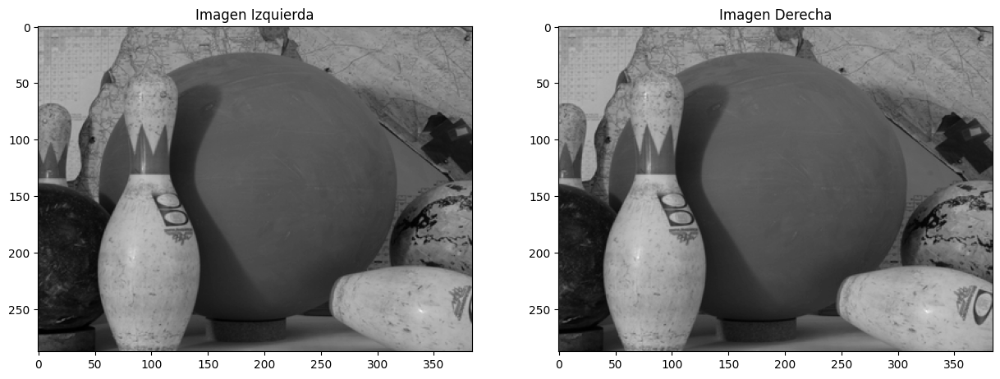

In [8]:
#Ponemos el nombre del dataset que vamos a usar
imgL, imgR = descargar_imagenes("Bowling")
show_images(imgL,imgR, "Imagen Izquierda", "Imagen Derecha")

## <font color='#4C5FDA'>**1.1. Disparidad**</font> <a name="tema3">


Hasta el momento hemos hablado de disparidad y profundidad, pero <font color= "52F17F" >**¿Queda claro el significado de ambos terminos?**</font>

✅ Veamoslo:

<font color = "EB9A54"> **Disparidad** </font>

En los seres humanos, la percepción visual de la estructura tridimensional es realizada por el sistema visual humano, mediante los ojos y el cerebro. Dada la posición
de los ojos, las imágenes que éstos presentan al cerebro son prácticamente idénticas salvo por una cierta diferencia en la posición relativa de los objetos en dichas imágenes.
A esta diferencia relativa se le denomina disparidad, y tiene una relación directa con la distancia (profundidad) a la que se encuentran los objetos entre sí y respecto del
observador. El cerebro es capaz de interpretar esa diferencia y reconstruir la estructura tridimensional de la escena que se está observando. El problema de la correspondencia estéreo trata por tanto de dar solución a ese mismo rompecabezas que el cerebro resuelve automáticamente de forma tan aparentemente sencilla.

En resumen, **la disparidad** es una medida fundamental en la visión estéreo que permite la percepción de profundidad. En otras palabras, se refiere a la diferencia en la posición horizontal de pixeles correspondientes a la imagenes izquierda y derecha.

$$ \color{orange} {d = X_l - X_d} $$

donde $\mathbf{d}$ es la disparidad, $\mathbf{X_l}$ es la posición horizontal de puntos en la camara izquierda y $\mathbf{X_d}$ es la posición horizontal de puntos en la cámara derecha.

Los algoritmos destinados a obtener el mapa de disparidad de una imagen, se
denominan algoritmos de correspondencia estéreo, y pueden ser clasificados,
fundamentalmente, en dos grandes grupos:
- Basados en área
- Basados en coincidencia de características

### <font color="EB9A54"> **Prueba 1.2:** </font> Aplicación de la visión estéreo y cálculo del mapa de disparidad

- Carga las imagenes del dataset `Tsukuba`, `Art` ó `Bowling`.
- Utiliza la función `cv.StereoSGBM_create` para crear un objeto de coincidencia de bloques stereo.
- Calcula el mapa de disparidad para las imagenes con la función `compute`
- Visualiza las imagenes y el mapa de disparidad



Consulta la documentación de la función `cv.StereoSGBM_create`:

https://docs.opencv.org/3.4/d2/d85/classcv_1_1StereoSGBM.html

In [64]:
#Ponemos el nombre del dataset que vamos a usar
imgL, imgR = descargar_imagenes("Bowling")

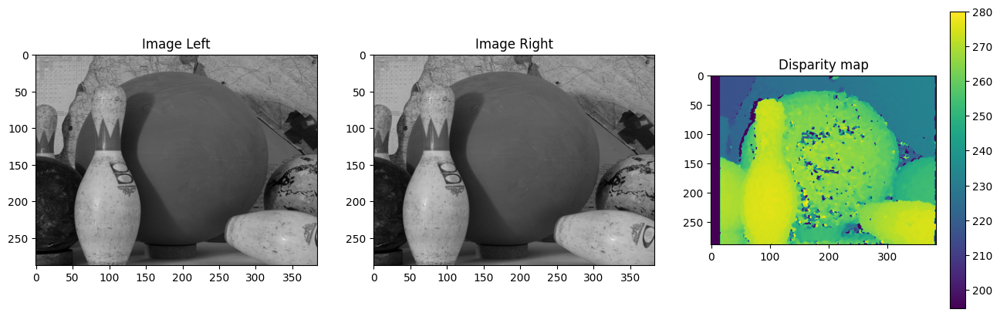

In [65]:
"""Pon tu código aquí"""
stereo = cv.StereoSGBM_create(numDisparities= 16, blockSize=5 )

# Aplica la función compute.
"""Pon tu código aquí"""
disparity_map = (stereo.compute(imgL, imgR) /3 ) + 200


plot_disparitymap(imgL, imgR, disparity_map)

## <font color='#4C5FDA'>**1.2. Profundidad**</font> <a name="tema4">

Se entiende por profundidad a la distancia a la que se encuentran los objetos entre sí y respecto de las camaras.

$$\color{orange}  {Z = \frac{fB}{d}} $$

donde $\mathbf{Z}$ es la profundidad, $\mathbf{f}$ es la distancia focal, $\mathbf{B}$ es la linea de base, y $\mathbf{d}$ es la disparidad.

Por ende la profundidad es inversamente proporcional a la disparidad



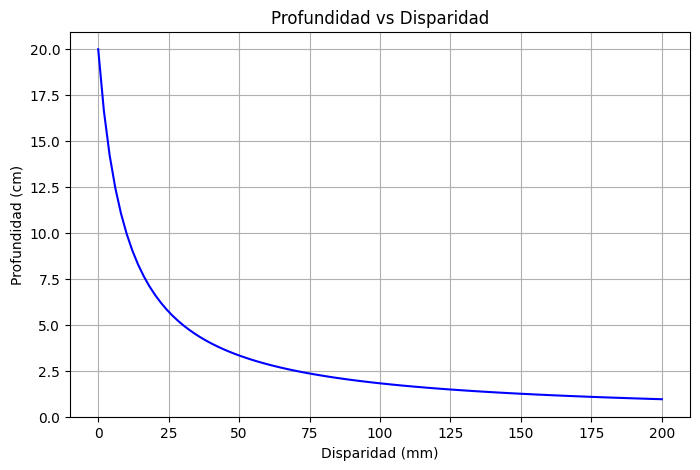

In [ ]:
# @title
disparidad = np.linspace(0, 200, 100) # Disparidad de 0 a 200
profundidad = 1 / (0.005 * disparidad + 0.05) # Relacion inversamente proporcional

# Plotting the data
plt.figure(figsize=(8, 5))
plt.plot(disparidad, profundidad, label='Profundidad Real', color='blue')
plt.title('Profundidad vs Disparidad')
plt.xlabel('Disparidad (mm)')
plt.ylabel('Profundidad (cm)')
plt.grid(True)
plt.show()

### <font color="EB9A54"> **Prueba 1.3:** </font> Cálculo mapa de profundidad

- Prueba valores distancia focal ( entre 2 y 5 ) y valores de baseline ( entre 100 y 200 )
- Calcula el mapa de profundidad siguiendo la fórmula vista anteriormente
- Umbraliza los valores del mapa de profundidad, buscando ver unicamente los objetos relevantes de la imagen ignorando el fondo y las zonas erroneas
- Visualiza las imagenes



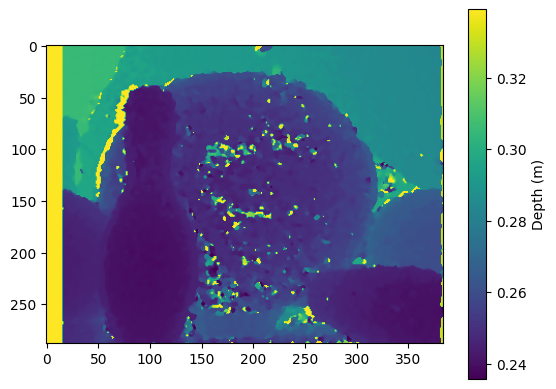

<Figure size 2000x400 with 0 Axes>

In [66]:
# Calcular el mapa de profundidad inicial
f = 6 # distancia focal en píxeles
B = 11 # baseline en milímetros


Z = (f * B)/ disparity_map
Z[(Z > 2.35)] = np.NaN # Handling infinite depth for disparity=0



# Visualización del mapa de profundidad ajustado
plt.imshow(Z, cmap='viridis')
plt.colorbar(label='Depth (m)')
plt.figure(figsize=(20,4))
plt.show()



 ## <font color='#4C5FDA'>**1.3. Pointcloud - 3D**</font> <a name="tema5">


Después de obtener el mapa de profundidad usando imágenes estéreo, el siguiente paso es crear una nube de puntos 3D. Esta técnica transforma cada punto capturado en las imágenes en una posición tridimensional, brindando una vista detallada del entorno.

Para realizar esta conversión, es fundamental comprender la relación entre las coordenadas de los píxeles en la imagen, la profundidad de cada uno de estos píxeles, y su posición en el espacio tridimensional. Utilizando la distancia focal de la cámara <font color='#EB9A54'> **f** </font> , y las coordenadas del centro óptico de la imagen <font color='#EB9A54'> **(c_x, c_y)** </font>, podemos calcular la posición <font color='#EB9A54'> **X, Y, Z** </font> en el espacio de cada punto correspondiente a un píxel <font color='#EB9A54'> **(U, V)** </font> en la imagen, donde Z es la profundidad obtenida del mapa de profundidad.


La posición 3D de cada punto se calcula mediante las siguientes ecuaciones:

$$ X = \frac{(u - c_x) \cdot Z}{f} \ $$

 $$ Y = \frac{(v - c_y) \cdot Z}{f}  $$


### <font color="EB9A54"> **Prueba 1.4:** </font> PointCloud

- Llama la imagen izquierda del dataset con el que calculaste mapas de profundidad y disparidad, para encontrar los centros ópticos.
- Escribe las fórmulas descritas para encontrar las posiciones 3D de cada punto
- Visualiza y navega el PointCloud



In [67]:
#Se puede llamar cualquiera de las dos imagenes ( izq, o der ), pero
#Decidimos llamar la izquierda, selecciona la imagen derecha si quieres --->   _ , img

#Pon el nombre del cojunto de datos con el que has venido trabajando "Entre comillas"
img,_ = descargar_imagenes("Bowling", "Color")


depth_map = np.copy(Z)
c_x = img.shape[1] / 2
c_y = img.shape[0] / 2
points = []
color = []

for v in range(depth_map.shape[0]):
    for u in range(depth_map.shape[1]):
        Z = depth_map[v, u]
        if Z > 0:  # Asegúrate de que la profundidad sea positiva
            X = (u - c_x) * Z / f
            Y = (v - c_y) * Z / f
            points.append([X, Y, Z])

            R = img[v, 383 - u, 0] / 255.0  # Normalizar R
            G = img[v, 383 - u, 1] / 255.0  # Normalizar G
            B = img[v, 383 - u, 2] / 255.0  # Normalizar B
            color.append([R, G, B])  # Almacena como una lista de valores RGB normalizados

plot_3d(points,color)

Estos resultados son obtenidos de imagenes estereó que sean proporcionando con calibración de camara. <font color= "52F17F" > **¿Que sucede si las imagenes proporcionado no provienen de un sistema calibrado? Veamoslo en la siguiente sección.** </font>

#  <font color='#4C5FDA'> **Caso N°2: Imágenes No Rectificadas**</color> <a name="tema6">

Cuando contamos con imágenes estéreo no rectificadas y no tenemos acceso a la calibración original de las cámaras, debemos abordar el proceso de rectificación de manera diferente. La rectificación se convierte en un paso crítico para alinear las imágenes de tal manera que los puntos correspondientes estén en la misma línea horizontal.

<image src='https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/metodologia_C2.png?raw=true'>

Este ajuste es esencial para el cálculo preciso de la disparidad y la extracción de la profundidad. A través de técnicas como la correspondencia de puntos característicos y la estimación de la homografía, podemos transformar las imágenes para que cumplan con las condiciones necesarias para aplicar la visión estérea.

## <font color='#4C5FDA'>**2.1 Calibración de camara**</font> <a name="tema7">


Supongamos que visitas un monumento y tomas una fotografia y algun tiempo despues un amigo visita el mismo monumento y toma otra fotografia, no tenemos idea de donde fueron tomadas las fotos, pero resulta que si conocemos los parámetros internos de las dos cámaras, entonces, a partir de estas dos vistas arbitrarias, puedes calcular la rotación y traslación de una camara con respecto a la otra. Y una vez hecho esto, podras calcular un modelo tridimensional del monomunemento. Este el problema de los sistemas no calibrados.

<image src='https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/camera-calibration.png?raw=true'>

Como vimos anteriormente, la calibración de camara considera los valores intrínsecos y extrínsecos para estimar una matriz de proyección

<font color='EB9A54'>**Valores intrínsecos**</font>

Estos valores describen las características internas de la cámara y cómo las imágenes son formadas por el sistema óptico de la misma.

- <font color='52F17F'>**Centro optico:** </font> El centro óptico, también conocido como el punto principal de la imagen, se refiere a las coordenadas $\mathbf{(O_x, O_y)}$  en el plano de la imagen (el sensor de la cámara), donde el eje óptico intersecta el plano. Este punto es esencial para la calibración de la cámara y para la conversión de coordenadas entre el mundo real y la imagen.

- <font color='52F17F'> **Distancia focal:** </font> La distancia focal $\mathbf{(F_x, F_y)}$  se refiere a la distancia entre el centro óptico de la lente y el plano de la imagen, expresada en términos de píxeles.


- <font color='52F17F'> **Parametros de distorsión:** </font> Los parámetros de distorsión describen cómo la luz que entra en la cámara se desvía de una proyección ideal debido a imperfecciones en el sistema óptico de la cámara. Estas distorsiones pueden hacer que las líneas rectas en el mundo real aparezcan curvas en la imagen, o que los objetos parezcan más grandes o más pequeños de lo que deberían ser. Los tipos más comunes de distorsión son:

  1. Distorsión Radial
  2. Distorsión Tangencial

<font color='EB9A54'>**Valores extrínsecos**</font>

Los valores extrínsecos de una cámara se refieren a la **traslación** y **orientación** de la cámara en un espacio tridimensional respecto a un sistema de coordenadas de referencia global. A diferencia de los valores intrínsecos, que son propiedades internas de la cámara y no cambian a menos que la configuración óptica de la cámara se modifique, los valores extrínsecos varían cada vez que la cámara se mueve.


🆗 Estos valores son fundamentales para la calibración de la cámara, un proceso que permite corregir las imágenes para eliminar o reducir estos efectos de distorsión, mejorando la precisión de la proyección de puntos 3D del mundo real a 2D en la imagen.

🎲 Y así estamos listos para calibrar la cámara, lo que es esencialmente significa estimar la matriz de proyección.

## <font color='#4C5FDA'>**2.2. Rectificación**</font> <a name="tema8">

En la práctica, <font color='EB9A54'> **la triangulación precisa no es completamente factible ya que los sistemas estéreo no cumplen con la configuración ideal** </font>. Sin embargo, la buena noticia es que cualquier par de imágenes tomadas con cualquier configuración (siempre y cuando haya solapamiento entre las imágenes, por supuesto) puede ser transformado para que cumplan con una configuración ideal de cámara estéreo. Esto se denomina rectificación estéreo o rectificación de imagen.

Este paso prepara el escenario para una introducción a la <font color='EB9A54'>**geometría epipolar** </font>, un conjunto de relaciones geométricas fundamentales que gobiernan la visión estéreo.


<image src = "https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/rectification.png?raw=true">


Aunque la rectificación se realiza automáticamente a través de algoritmos, los principios detrás de ella se derivan directamente de la geometría epipolar. Así, antes de poder calcular la disparidad entre imágenes de forma efectiva, debemos comprender y aplicar estas relaciones epipolares para alinear nuestras imágenes, asegurando que cada punto en la imagen izquierda tenga su correspondencia en la misma línea horizontal de la imagen derecha.




### <font color='#4C5FDA'>**2.2.1 Geometría epipolar**</font> <a name="tema9">

La geometría epipolar es el <font color='EB9A54'>**conjunto de restricciones geométricas entre dos vistas de una escena.** </font> Cuando dos cámaras capturan una escena 3D desde dos posiciones diferentes, hay una serie de relaciones geométricas entre los puntos 3D y sus proyecciones sobre las imágenes 2D que generan restricciones entre los puntos de la imagen. Estas relaciones se derivan del supuesto de que las cámaras pueden aproximarse mediante el modelo de cámara estenopeica (por ejemplo, sus imágenes no están distorsionadas).

<image src = "https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/epipolar%20geometry.png?raw=true">



### <font color='#4C5FDA'>**2.2.2 Conceptos**</font> <a name="tema10">

En primer lugar tenemos el plano epipolar. Este plano está formado por 3 puntos: los centros ópticos izquierdo y derecho (Cl y Cr ), y un punto 3D en el mundo (X).



<image src = "https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/epipolar1.png?raw=true">

Cuando \(X\) es observado por ambas cámaras, se forma un plano único que atraviesa \(X\) y los centros ópticos de ambas cámaras, \(C_l\) y \(C_r\). Este plano se conoce como el plano epipolar y es significativo ya que las líneas donde este plano corta los planos de las imágenes de las cámaras forman las **líneas epipolares**. En la visualización, estas intersecciones aparecen como dos líneas que atraviesan las imágenes de las cámaras izquierda y derecha.

Las proyecciones 2D de \(X\) en las imágenes de las cámaras están denotadas como \(X_l\) y \(X_r\). Estos puntos no solo se ubican en las imágenes correspondientes a cada cámara sino que también caen precisamente sobre las líneas epipolares respectivas. La importancia de las líneas epipolares radica en su capacidad para limitar la búsqueda de correspondencias de puntos entre dos imágenes estéreo: en lugar de buscar en toda la imagen, simplemente necesitamos buscar a lo largo de la línea epipolar relevante.



<br>
<br>
Comencemos


Image sizes: (288, 384) and (288, 384)


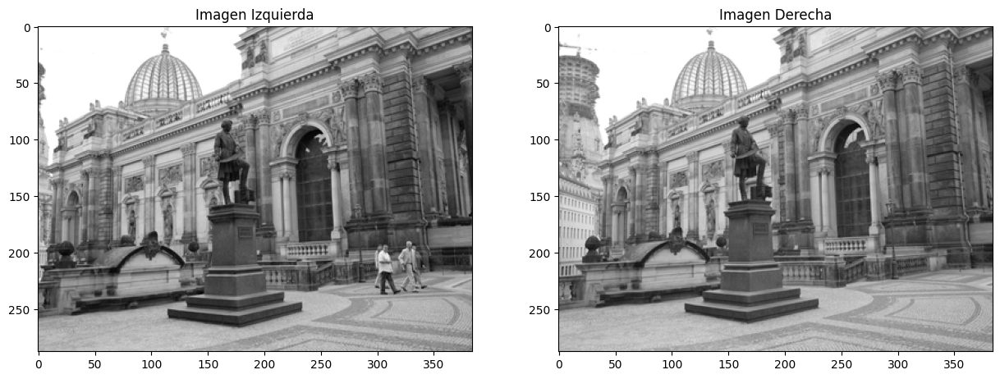

In [44]:
#NO MODIFIQUES NADA
imgLeft, imgRight = descargar_imagenes("non-rectified-images")
show_images(imgLeft,imgRight, "Imagen Izquierda", "Imagen Derecha")

### <font color='#4C5FDA'>**2.2.3 KeyPoints**</font> <a name="tema11">

Implementamos un proceso clave en la visión estéreo cuando trabajamos con imágenes no rectificadas: <font color='EB9A54'>**la identificación y el emparejamiento de puntos característicos** </font> entre dos imágenes tomadas desde diferentes ángulos. Este proceso se compone de varios pasos esenciales:

<br>
<br>

1. <font color='EB9A54'>Utilizamos el algoritmo SIFT (Scale-Invariant Feature Transform) </font> para detectar puntos característicos en cada imagen y calcular sus descriptores. Esto nos proporciona un conjunto robusto de puntos que describen de manera única regiones de las imágenes.

  Documentación de SIFT: <https://docs.opencv.org/3.4/d7/d60/classcv_1_1SIFT.html>
<br>


2. <font color='EB9A54'>Emparejamiento de Descriptores con FLANN</font> Empleamos FLANN (Fast Library for Approximate Nearest Neighbors) para encontrar los emparejamientos más fuertes entre los puntos de ambas imágenes.

  Documentación de FLANN: <https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html>
<br>

3. <font color='EB9A54'>Filtrado de Emparejamientos con el Test de Ratio</font> Para mejorar la calidad de los emparejamientos y reducir el número de falsos positivos, aplicamos el test de ratio propuesto por D. Lowe en el contexto de SIFT. Este test descarta aquellos emparejamientos cuya distancia entre el mejor y el segundo mejor vecino no es significativamente menor que un umbral definido (típicamente, 0.8). Esto nos asegura que sólo conservamos los emparejamientos más confiables.

In [54]:
#NO MODIFIQUES NADA

sift = cv.xfeatures2d.SIFT_create()
keyPointsLeft, descriptorsLeft = sift.detectAndCompute(imgLeft, None)
keyPointsRight, descriptorsRight = sift.detectAndCompute(imgRight, None)

FLANN_INDEX_KDTREE = 0
indexParams = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
searchParams = dict(checks=50)
flann = cv.FlannBasedMatcher(indexParams, searchParams)

goodMatches = []
ptsLeft = []
ptsRight = []
matches = flann.knnMatch(descriptorsLeft, descriptorsRight, k=2)

print(f"Número de coincidencias antes del test de ratio: {len(matches)}")

for m, n in matches:
    if m.distance < 0.8 * n.distance:
        goodMatches.append(m)
        ptsLeft.append(keyPointsLeft[m.queryIdx].pt)
        ptsRight.append(keyPointsRight[m.trainIdx].pt)

print(f"Número de buenas coincidencias después del test de ratio: {len(goodMatches)}")


Número de coincidencias antes del test de ratio: 1159
Número de buenas coincidencias después del test de ratio: 542


Que tal si vemos algunos de los emparejamientos que está haciendo nuestro algoritmo. Carguemos 30 parejas de puntos de manera aleatoria.

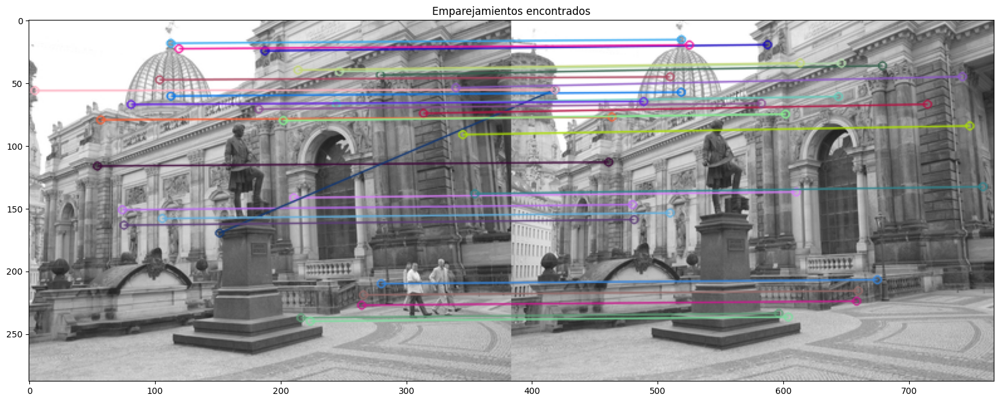

In [55]:
#NO MODIFIQUES NADA

parejas = random.sample(goodMatches,min(30, len(goodMatches)))
imgMatches = cv.drawMatches(imgLeft, keyPointsLeft, imgRight, keyPointsRight, parejas , None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20,10))
plt.imshow(imgMatches)
plt.title("Emparejamientos encontrados")
plt.show()


### <font color='#4C5FDA'>**2.2.4 Matriz Fundamental**</font> <a name="tema12">

 La matriz fundamental F es una representación algebraica de las restricciones epipolares entre dos vistas de una escena. Es decir, para cada punto en una imagen, F predice la línea correspondiente (llamada línea epipolar) en la otra imagen en la que debe encontrarse su correspondiente.


 Utilizamos `cv.findFundamentalMat().` con `cv.FM_LMEDS` lo que permite una estimación robusta de F incluso en presencia de puntos atípicos (outliers). El algoritmo selecciona subconjuntos aleatorios de los puntos emparejados, calcula F para cada subconjunto, y elige la matriz que mejor explica la mayoría de las correspondencias.


 La matriz fundamental estimada es fundamental para muchas tareas posteriores en visión estérea, como la rectificación de imágenes, la reconstrucción de la geometría de la escena, y la estimación de la pose relativa de las cámaras. La precisión de F impacta directamente en la calidad y fiabilidad de estas operaciones.
<br><br>
 Enlace a la documentación de las funciones:
 - [cv.findFundamentalMat](https://amroamroamro.github.io/mexopencv/matlab/cv.findFundamentalMat.html)

 - [cv.FM_LMEDS](https://docs.opencv.org/4.x/d9/d0c/group__calib3d.html)

In [56]:
#NO MODIFIQUES NADA
ptsLeft = np.float32(ptsLeft)
ptsRight = np.float32(ptsRight)
F, mask = cv.findFundamentalMat(ptsLeft, ptsRight, cv.FM_LMEDS)

ptsLeft = ptsLeft[mask.ravel() == 1]
ptsRight = ptsRight[mask.ravel() == 1]
print(F)

[[ 3.84076215e-06 -4.39408467e-06 -1.77524458e-02]
 [ 9.48044112e-05 -1.60904100e-05 -4.36736332e-01]
 [ 1.24126765e-03  4.24663986e-01  1.00000000e+00]]


### <font color='#4C5FDA'>**2.2.5 Lineas epipolares**</font> <a name="tema13">

Una vez establecidas las correspondencias entre puntos de interés en un par de imágenes estéreo, el siguiente paso consiste en calcular y visualizar las líneas epipolares. Estas líneas son fundamentales en la visión estérea, ya que representan el camino geométrico que un punto en una imagen puede seguir en la otra imagen. En otras palabras, si conocemos un punto en una imagen, su correspondiente en la otra imagen debe encontrarse a lo largo de su línea epipolar correspondiente.

Para calcular estas líneas, utilizamos la matriz fundamental  F, obtenida previamente a partir de las correspondencias de puntos entre las imágenes. La función `cv.computeCorrespondEpilines()` toma un conjunto de puntos en una imagen y la matriz fundamental para calcular las líneas epipolares en la otra imagen.

<br><br>
Enlace a la documentación:

<https://amroamroamro.github.io/mexopencv/matlab/cv.computeCorrespondEpilines.html>

Image sizes: (288, 384) and (288, 384)


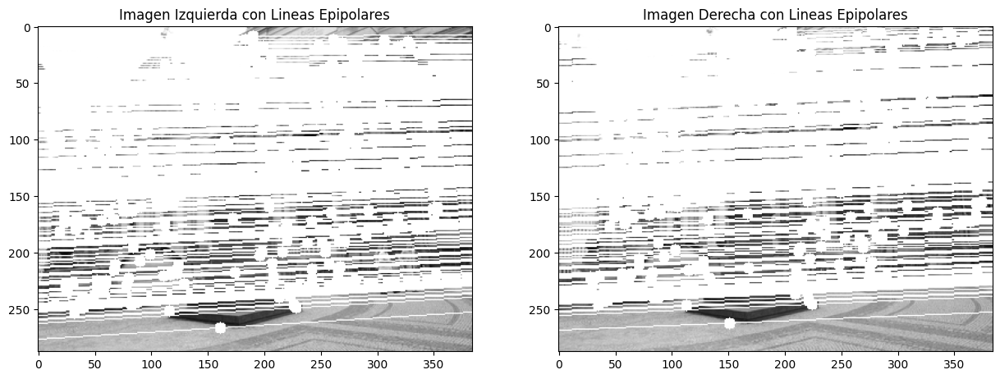

In [57]:
# Calcular y dibujar las líneas epipolares en las copias de las imágenes
linesLeft = cv.computeCorrespondEpilines(ptsRight.reshape(-1, 1, 2), 2, F)
linesLeft = linesLeft.reshape(-1, 3)
img5 = drawlines(imgLeft, imgRight, linesLeft, ptsLeft, ptsRight)

linesRight = cv.computeCorrespondEpilines(ptsLeft.reshape(-1, 1, 2), 1, F)
linesRight = linesRight.reshape(-1, 3)
img3 = drawlines(imgRight, imgLeft, linesRight, ptsRight, ptsLeft)

show_images(img5,img3, "Imagen Izquierda con Lineas Epipolares", "Imagen Derecha con Lineas Epipolares")



### <font color='#4C5FDA'>**2.2.6 Homografías**</font> <a name="tema14">

Las homografías son transformaciones geométricas que describen cómo un plano puede ser mapeado a otro plano mediante una transformación proyectiva. Para ello, hacemos uso de la función `cv.stereoRectifyUncalibrated(),` la cual calcula las homografías h1 y h2 y necesarias para rectificar las imágenes izquierda y derecha, respectivamente. Estas homografías se derivan de la geometría epipolar capturada por la matriz fundamental y las correspondencias de puntos.

Una vez calculadas las homografías, aplicamos las transformaciones a las imágenes originales utilizando la función `cv.warpPerspective()`. Esta operación ajusta las imágenes para que sus puntos correspondientes queden alineados en filas horizontales, eliminando la necesidad de buscar correspondencias a lo largo de líneas epipolares complejas. El resultado son dos imágenes rectificadas, listas para el cálculo de disparidad y la posterior reconstrucción tridimensional.

 Enlace a la documentación de las funciones:
 - [cv.stereoRectifyUncalibrated](https://amroamroamro.github.io/mexopencv/matlab/cv.stereoRectifyUncalibrated.html)

 - [cv.warpPerspective()](https://docs.opencv.org/4.x/da/d54/group__imgproc__transform.html)

Image sizes: (288, 384) and (288, 384)


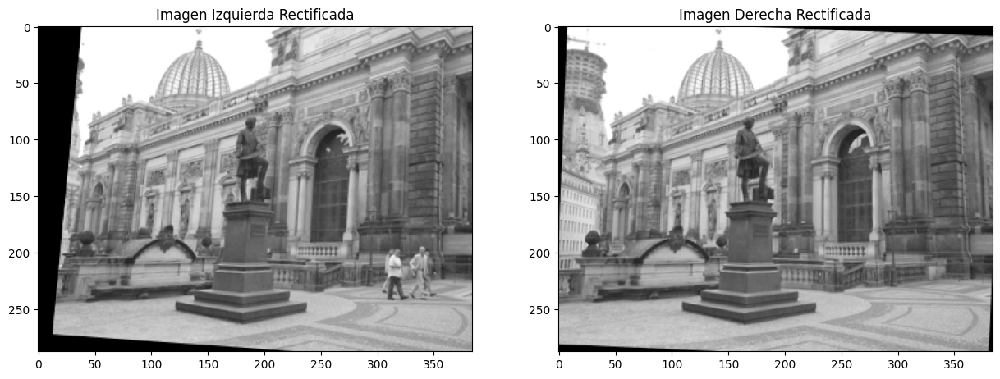

In [58]:
# Calcular las homografías para la rectificación sin datos de calibración de cámara
_, h1, h2 = cv.stereoRectifyUncalibrated(np.float32(ptsLeft), np.float32(ptsRight), F, imgLeft.shape[:2])

# Aplicar las homografías para rectificar las imágenes
imgLeftRectified = cv.warpPerspective(imgLeft, h1, (imgLeft.shape[1], imgLeft.shape[0]))
imgRightRectified = cv.warpPerspective(imgRight, h2, (imgRight.shape[1], imgRight.shape[0]))
show_images(imgLeftRectified,imgRightRectified, "Imagen Izquierda Rectificada", "Imagen Derecha Rectificada")


Comprobemos que las lineas epipolares ya se encuentran de manera horizontal, con ello verificamos que la imagen ya está rectificada.

Image sizes: (288, 384) and (288, 384)


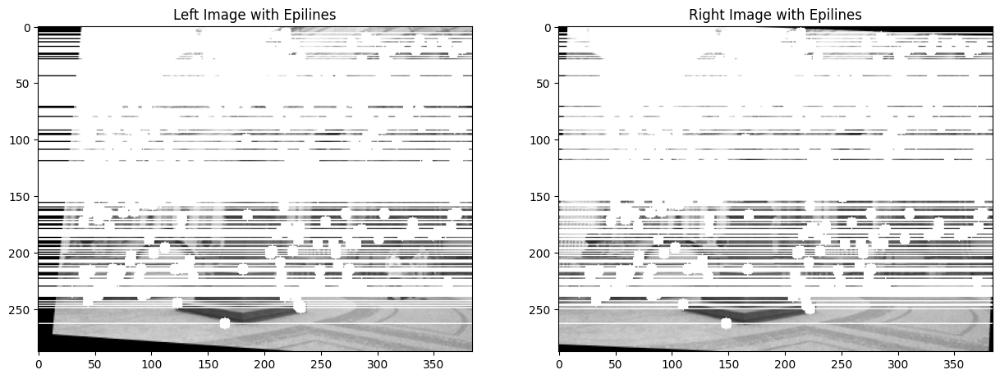

In [59]:
imgLeftWithEpilines, imgRightWithEpilines = add_epilines_to_rectified_images(imgLeftRectified, imgRightRectified, ptsLeft, ptsRight, h1, h2)
show_images(imgLeftWithEpilines, imgRightWithEpilines, "Left Image with Epilines", "Right Image with Epilines")


## <font color='#4C5FDA'>**2.3 Disparidad**</font> <a name="tema15">

Ya con nuestras imágenes rectificadas podemos ejecutar nuevamente el calculo del mapa de disparidad, al igual como hicimos en el paso anterior.

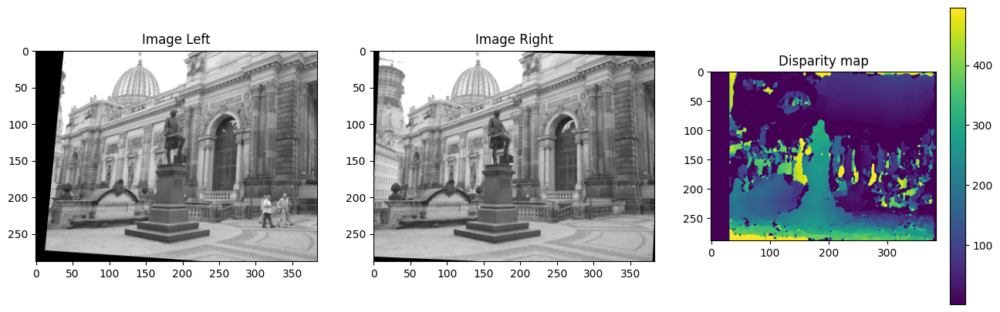

In [60]:
stereo = cv.StereoSGBM_create(numDisparities=32,blockSize=11)

disparity_map = stereo.compute(imgLeftRectified, imgRightRectified)
disparity_map[(disparity_map <= 0)] = 1

plot_disparitymap(imgLeftRectified, imgRightRectified, disparity_map)

## <font color='#4C5FDA'>**2.4 Profundidad**</font> <a name="tema16">

Ya teniendo nuestro mapa de disparidad, podemos calcular el mapa de profundidad. Ya que no tenemos los datos de las cámaras con las que fueron tomadas las fotos, debemos asumir algunos valores para poder calcular el mapa de profundidad

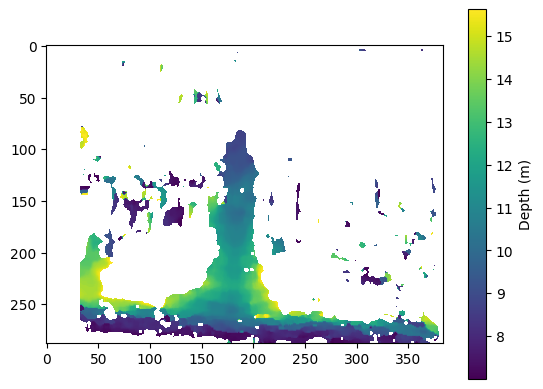

<Figure size 2000x400 with 0 Axes>

In [61]:
f = 2.780 # distancia focal en píxeles
B = 1000  # baseline en milímetros


Z = ((f * B) / disparity_map)
Z[(Z > 15.70)] = np.NaN # Handling infinite depth for disparity=0
Z[(Z < 7)] = np.NaN # Handling infinite depth for disparity=0

Z = np.clip(Z, 7,18)


# Visualización del mapa de profundidad ajustado
plt.imshow(Z, cmap='viridis')
plt.colorbar(label='Depth (m)')
plt.figure(figsize=(20,4))
plt.show()


## <font color='#4C5FDA'>**2.5 PointCloud - 3D**</font> <a name="tema17">

Por ultimo, podemos pasar de la vista 2D de nuestro mapa de profundidad, a una perspectiva 3D de nuestra escena. Debido a que no conocemos los parámetros de la cámara, y a las limitaciones que presenta la vision estereo, es normal que esta apreciacion no sea la mejor.

In [62]:
img, _ = descargar_imagenes("non-rectified-images", "Color")

depth_map = np.copy(Z)
c_x = img.shape[1] / 2
c_y = img.shape[0] / 2
points = []
color = []
for v in range(depth_map.shape[0]):
    for u in range(depth_map.shape[1]):
        Z = depth_map[v, u]
        if Z > 0:  # Asegúrate de que la profundidad sea positiva
            X = (u - c_x) * Z / f
            Y = (v - c_y) * Z / f
            points.append([X, Y, Z])

            R = img[v, 383 - u, 0] / 255.0  # Normalizar R
            G = img[v, 383 - u, 1] / 255.0  # Normalizar G
            B = img[v, 383 - u, 2] / 255.0  # Normalizar B
            color.append([R, G, B])  # Almacena como una lista de valores RGB normalizados

plot_3d(points,color)